# Project Phase 1 
## SimBoost


#### Name:  Ashkan Soleymani
#### Student No.: 95105635

Drug discovery is a time-consuming, laborious, costly and high-risk process. According to a report by the Eastern Research Group (ERG), it usually takes 10-15 years to develop a new drug. However, the success rate of developing a new molecular entity is only 2.01%. \
Finding a compound that selectively binds to a particular protein is a highly challenging and typically expensive procedure in the drug development process. \
In this project we are going to implement [SimBoost](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5395521/#CR42) which is machine-learning approch for predicting drug–target binding affinities using gradient boosting.




We will be using [Davis](http://staff.cs.utu.fi/~aatapa/data/DrugTarget/) dataset, which contains selectivity assays of the kinase protein family and the relevant inhibitors with their respective dissociation constant (Kd) values. It comprises interactions of 442 proteins and 68 drugs.

## 1. Setup (15 Points)

### 1.1 Imports libs

In [180]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random

### 1.2 Loading data

We need following files for this project:
- `target_gene_names.txt`: gene names of the targets
- `drug_PubChem_CIDs.txt`: PubChem CIDs of the drugs
- `drug-drug_similarities_2D.txt`: drug-drug structural fingerprint similarities computed the Structure Clustering sever at PubChem
- `target-target_similarities_WS_normalized.txt`: target-target sequence similarities computed with the normalized versions of the Smith-Waterman (SW) score.
- `drug-target_interaction_affinities_Kd__Davis_et_al.2011.txt`: drug-target interaction affinities.

The rows (and columns) of the drug-drug similarity matrices correspond to the rows of the interaction affinity matrix and the rows (and columns) of the target-target similarity matrices correspond to the columns of the interaction affinity matrix.

In [181]:
target_gene_names = pd.read_csv("target_gene_names.txt", header=None, index_col = 0)
drug_pubchemIDs = pd.read_csv("drug_PubChem_CIDs.txt", header=None, index_col = 0) #  dtype=str
drug_pubchemIDs.index = drug_pubchemIDs.index.map(str)
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# Load each file using pd.read_csv and use target_gene_names and drug_pubchemIDs
# to correspond row index and columns of all three files.
# sim_targets.shape == (442, 442)
# sim_drugs.shape == (68, 68)
# bindings.shape == (68, 442)
# Note that target_gene_names and drug_pubchemIDs dataframes are empty, we are
# going to fill them with features.
#################################################################################
sim_targets = pd.read_csv("target-target_similarities_WS_normalized.txt", header=None, sep = ' ')
sim_drugs = pd.read_csv("drug-drug_similarities_2D.txt", header=None, sep = ' ')
bindings = pd.read_csv("drug-target_interaction_affinities_Kd__Davis_et_al.2011.txt", header=None, sep = ' ')

sim_targets.columns, sim_targets.index = target_gene_names.index, target_gene_names.index
sim_drugs.columns, sim_drugs.index = drug_pubchemIDs.index, drug_pubchemIDs.index
bindings.columns, bindings.index = target_gene_names.index, drug_pubchemIDs.index

#################################################################################
#                                   THE END                                     #
#################################################################################
sim_targets.shape, sim_drugs.shape, bindings.shape

((442, 442), (68, 68), (68, 442))

### 1.3 Preprocessing

In davis dataset, standard value is Kd in nM. we used the transformation below:

### $pK_{d}=-log_{10}\frac{K_d}{1e9}$ 


In [182]:
drug_pubchemIDs.sort_index(inplace=True)
target_gene_names.sort_index(inplace=True)
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# sort sim_targets, sim_drugs, bindings based on their index like above 
# divide all values of sim_targets by 100
# transform binding values as mentioned above
#################################################################################
for axis in [0, 1]:
    sim_targets.sort_index(inplace=True, axis=axis)
    sim_drugs.sort_index(inplace=True, axis=axis)
    bindings.sort_index(inplace=True, axis=axis)

sim_targets /= 100
transformed_bindings = bindings.apply(lambda kd: -1 * np.log10(kd / 1e9), axis=1)
transformed_bindings.sort_index(inplace=True)
#################################################################################
#                                   THE END                                     #
#################################################################################
transformed_bindings.head()

,AAK1,ABL1(E255K)-phosphorylated,ABL1(F317I)-nonphosphorylated,ABL1(F317I)-phosphorylated,ABL1(F317L)-nonphosphorylated,ABL1(F317L)-phosphorylated,ABL1(H396P)-nonphosphorylated,ABL1(H396P)-phosphorylated,ABL1(M351T)-phosphorylated,ABL1(Q252H)-nonphosphorylated,...,YANK3,YES,YSK1,YSK4,ZAK,ZAP70,p38-alpha,p38-beta,p38-delta,p38-gamma
0,,,,,,,,,,,,,,,,,,,,,
10074640,5.000000,6.853872,8.096910,7.107905,8.000000,6.958607,7.958607,6.853872,6.853872,8.221849,...,5.0,6.244125,5.000000,5.000000,6.113509,5.0,5.000000,5.0,5.0,5.0
10113978,5.537602,6.096910,5.000000,5.000000,5.356547,5.568636,6.420216,6.154902,6.251812,6.275724,...,5.0,5.301030,5.000000,6.026872,5.000000,5.0,5.000000,5.0,5.0,5.0
10127622,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.0,5.000000,5.000000,5.000000,5.000000,5.0,5.000000,5.0,5.0,5.0
10138260,7.180456,6.508638,5.468521,5.619789,5.481486,5.920819,6.619789,6.251812,6.301030,6.060481,...,5.0,6.585027,6.443697,7.920819,5.000000,5.0,5.000000,5.0,5.0,5.0
10184653,5.000000,6.376751,5.537602,6.124939,6.236572,6.638272,6.301030,6.301030,5.920819,6.102373,...,5.0,5.000000,5.000000,5.000000,5.000000,5.0,5.886057,5.0,5.0,5.0


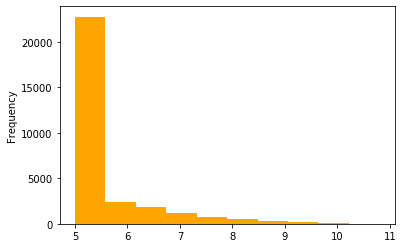

In [183]:
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# Plot histogram of all values in transformed_bindings
# Hint: use .stack and .plot.hist  
#################################################################################

transformed_bindings.stack().plot.hist(color="orange")

#################################################################################
#                                   THE END                                     #
#################################################################################

In [184]:
transformed_bindings.shape

(68, 442)

As you can see in histogram. The peak at pKd value 5 (10000 nM), These values correspond to the negative pairs that either have very weak binding affinities (Kd > 10000nM) or are not observed in the primary screen.

### 1.4 Drug-Target-Binding

In [185]:
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# use drug_target_binding and build drug_target_binding dataframe 
# in each row of dataframe you must have one drug-target pair and their 
# transformed binding value, in the end you must have a dataframe with 
# 30056 row and 3 columns ['Drug', 'Target', 'Binding_Val']
#################################################################################
drug_target_binding = pd.DataFrame(np.array(list(map(list, zip(*transformed_bindings.stack().index)))).T, columns = ["Drug", "Target"])
drug_target_binding["Binding_Val"] = list(transformed_bindings.stack())
#################################################################################
#                                   THE END                                     #
#################################################################################
drug_target_binding.head()

,Drug,Target,Binding_Val
0,10074640,AAK1,5.000000
1,10074640,ABL1(E255K)-phosphorylated,6.853872
2,10074640,ABL1(F317I)-nonphosphorylated,8.096910
3,10074640,ABL1(F317I)-phosphorylated,7.107905
4,10074640,ABL1(F317L)-nonphosphorylated,8.000000


### 1.5 Train, Validation and Test Datasets

In [186]:
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# split drug_target_binding dataframe to 3 sets (train_data, val_data, test_data)
# split ratio is up to you
# at the end you must have 3 sets that each of them has 3 columns
#################################################################################
train_data = None
val_data = None
test_data = None

test_ratio, val_ratio = 0.2, 0.1

train_data, test_data = train_test_split(drug_target_binding, test_size=test_ratio, shuffle=True)
train_data, val_data = train_test_split(train_data, test_size=val_ratio / (1 - test_ratio), shuffle=True)
#################################################################################
#                                   THE END                                     #
#################################################################################
train_data.shape, val_data.shape, test_data.shape

((21038, 3), (3006, 3), (6012, 3))

## 2.Feature Engineering (35 Points)

In this part we are going to extract some feature for each target/drug. after that we will replace these features with their names/pubchemIDs. 

### 2.1 Average Similarities and Binding values

In [187]:
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# for each target compute their average similarities in sim_targets matrix
# and average binding value (in train_data).
# add these two feature as 'avg-sim', 'avg-binding' to target_gene_names DataFrame
#################################################################################

target_gene_names["avg-sim-target"] = sim_targets.mean()
target_gene_names["avg-binding-target"] = train_data.groupby("Target").mean()["Binding_Val"]

#################################################################################
#                                   THE END                                     #
#################################################################################
target_gene_names.head()

,avg-sim-target,avg-binding-target
0,,
AAK1,0.479173,5.749060
ABL1(E255K)-phosphorylated,0.535796,6.056724
ABL1(F317I)-nonphosphorylated,0.535796,5.709811
ABL1(F317I)-phosphorylated,0.535796,5.705342
ABL1(F317L)-nonphosphorylated,0.535796,5.885890


In [188]:
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# for each drug compute their average similarities in sim_drugs matrix
# and average binding value (in train_data).
# add these two feature as 'avg-sim', 'avg-binding' to drug_pubchemIDs DataFrame
#################################################################################

drug_pubchemIDs["avg-sim-drug"] = sim_drugs.mean()
drug_pubchemIDs["avg-binding-drug"] = train_data.groupby("Drug").mean()["Binding_Val"]

#################################################################################
#                                   THE END                                     #
#################################################################################
drug_pubchemIDs.head()

,avg-sim-drug,avg-binding-drug
0,,
10074640,0.591647,5.179329
10113978,0.582809,5.372680
10127622,0.547706,5.015313
10138260,0.572397,5.867030
10184653,0.614324,5.236789


### 2.2 Drug/Target Similarity Networks

#### 2.2.1 Build Networks

You must build two networks one for drugs and another one for targets. The nodes are drugs or targets, and an edge between two nodes exists if their similarity is above a threshold. The value of threshold is up to you. \
For building networks, we are going to use [igraph](https://igraph.org/) package. 

In [189]:
import igraph

Graph Summary is: 
IGRAPH D-W- 68 458 -- 
+ attr: label (v), weight (e)
Maximum degree is: 40


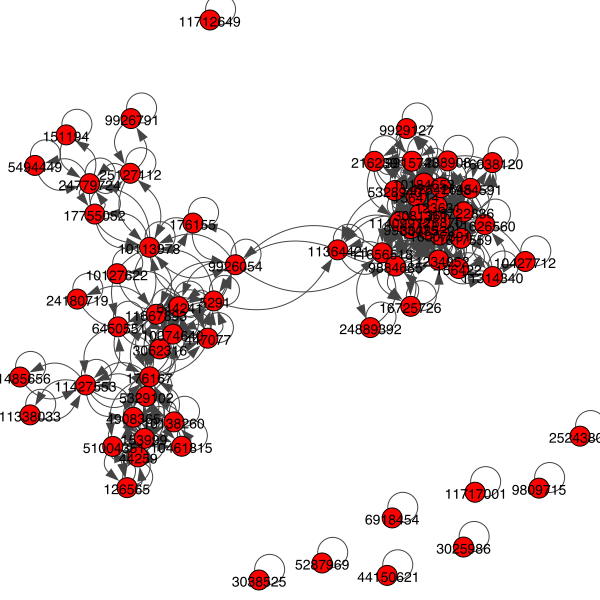

In [190]:
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# define drug_sim_threshold, target_sim_threshold and use these values to
# build two network one for drugs and another one for targets using sim_drugs
# and sim_targets.
# Hint: you can use igraph.Graph.Adjacency, you can plot your graph using 
# igraph.plot
#################################################################################
drug_sim_threshold = np.quantile(sim_drugs.values, 0.9)

drug_graph = igraph.Graph.Adjacency((sim_drugs.values > drug_sim_threshold).tolist())
drug_graph.es['weight'] = sim_drugs.values[sim_drugs.values > drug_sim_threshold]
drug_graph.vs["label"] = sim_drugs.index

print("Graph Summary is: ")
igraph.summary(drug_graph)
print("Maximum degree is: " + str(drug_graph.maxdegree()))
igraph.plot(drug_graph, labels=True)
#################################################################################
#                                   THE END                                     #
#################################################################################

In [191]:
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# define drug_sim_threshold, target_sim_threshold and use these values to
# build two network one for drugs and another one for targets using sim_drugs
# and sim_targets.
# Hint: you can use igraph.Graph.Adjacency, you can plot your graph using 
# igraph.plot
#################################################################################
target_sim_threshold = np.quantile(sim_targets.values, 0.9)

target_graph = igraph.Graph.Adjacency((sim_targets.values > target_sim_threshold).tolist())
target_graph.es['weight'] = sim_targets.values[sim_targets.values > target_sim_threshold]
target_graph.vs["label"] = sim_targets.index

print("Graph Summary is: ")
igraph.summary(target_graph)
print("Maximum degree is: " + str(target_graph.maxdegree()))
igraph.plot(target_graph, labels=True)
#################################################################################
#                                   THE END                                     #
#################################################################################

Graph Summary is: 
IGRAPH D-W- 442 19534 -- 
+ attr: label (v), weight (e)
Maximum degree is: 366


Explain how you choose your threshold values? \
In order to use a proper threshold, I used quantile as a metric, thus, I have to set only one quantile parameter. For setting that parameter, it's worth mentioning that by increasing that parameter enough, we should make the graph look meaningful and almost splitted to different clusters. Also, other meters e.g. max dgree in the graph can be intuitive to evaluate the resulting graph.

#### 2.2.2 Number of neighbors, PageRank

In [192]:
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# for each drug compute number of neighbors and it's PageRank score. 
# add these two feature as 'n_neighbors', 'page_rank' to drug_pubchemIDs DataFrame.
# do the above for each target too and add them to target_gene_names DataFrame.
# Hint: for pagerank score you can use graph.pagerank.

drug_pubchemIDs["n_neighbors_drug"] = drug_graph.degree()
drug_pubchemIDs["page_rank_drug"] = drug_graph.pagerank()

target_gene_names["n_neighbors_target"] = target_graph.degree()
target_gene_names["page_rank_target"] = target_graph.pagerank()

#################################################################################
#                                   THE END                                     #
#################################################################################
target_gene_names.head()
drug_pubchemIDs.head()

,avg-sim-drug,avg-binding-drug,n_neighbors_drug,page_rank_drug
0,,,,
10074640,0.591647,5.179329,16,0.018735
10113978,0.582809,5.372680,18,0.024454
10127622,0.547706,5.015313,4,0.007441
10138260,0.572397,5.867030,12,0.014436
10184653,0.614324,5.236789,30,0.021015


In [193]:
# drug_pubchemIDs["eigenvector_centrality"] = drug_graph.eigenvector_centrality()
# drug_pubchemIDs["betweenness"] = drug_graph.betweenness()
# drug_pubchemIDs["closeness"] = drug_graph.closeness()
# drug_pubchemIDs.head()

### 2.3 Non-negative Matrix Factorization

For extracting features from binding affinity matrix we are going to use [Non-negative Matrix Factorization](https://en.wikipedia.org/wiki/Non-negative_matrix_factorization). 

In NMF, we are trying to approximately factor a matrix $B ∈ R_+^{d×t}$ (binding affinity matrix of d drugs and t targets) into two matrices $P ∈ R_+^{k×d}$ and $Q ∈ R_+^{k×t}$ which  $B = P^TQ$

In this problem, you can set $k$ (Latent dimension of $P$ and $Q$ matrices) to any number below 10.


The columns of the factor matrices P and Q are utilized as parts of the feature vectors for the drugs and targets respectively.

In [194]:
from sklearn.decomposition import NMF

In [195]:
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# define latent_dim variable, after that use train_data to build bindings matrix
# because we remove some of the bindings values when we choose train_data in part 1.5  
# your matrix will have some na values fill them with 5 (Which is lowest binding score).
#################################################################################
latent_dim = 3

train_binding_matrix = pd.DataFrame(np.nan_to_num(train_data.set_index(['Drug', 'Target']).unstack().values, nan=5)
                                    , columns=sim_targets.index, index=sim_drugs.index)
#################################################################################
#                                   THE END                                     #
#################################################################################
train_binding_matrix.head()

,AAK1,ABL1(E255K)-phosphorylated,ABL1(F317I)-nonphosphorylated,ABL1(F317I)-phosphorylated,ABL1(F317L)-nonphosphorylated,ABL1(F317L)-phosphorylated,ABL1(H396P)-nonphosphorylated,ABL1(H396P)-phosphorylated,ABL1(M351T)-phosphorylated,ABL1(Q252H)-nonphosphorylated,...,YANK3,YES,YSK1,YSK4,ZAK,ZAP70,p38-alpha,p38-beta,p38-delta,p38-gamma
0,,,,,,,,,,,,,,,,,,,,,
10074640,5.000000,6.853872,5.000000,7.107905,8.000000,5.000000,7.958607,5.000000,6.853872,5.000000,...,5.0,6.244125,5.0,5.0,6.113509,5.0,5.0,5.0,5.0,5.0
10113978,5.537602,5.000000,5.000000,5.000000,5.356547,5.000000,5.000000,6.154902,6.251812,6.275724,...,5.0,5.301030,5.0,5.0,5.000000,5.0,5.0,5.0,5.0,5.0
10127622,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.0,5.000000,5.0,5.0,5.000000,5.0,5.0,5.0,5.0,5.0
10138260,5.000000,6.508638,5.468521,5.619789,5.481486,5.920819,5.000000,6.251812,6.301030,6.060481,...,5.0,6.585027,5.0,5.0,5.000000,5.0,5.0,5.0,5.0,5.0
10184653,5.000000,6.376751,5.537602,6.124939,6.236572,5.000000,5.000000,6.301030,5.000000,6.102373,...,5.0,5.000000,5.0,5.0,5.000000,5.0,5.0,5.0,5.0,5.0


In [196]:
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# Use sklearn NMF and factor 'train_binding_matrix' to P and Q.
# add columns of P and Q as features to 'drug_pubchemIDs' and 'target_gene_names'
#################################################################################

model = NMF(n_components=latent_dim, init='random', random_state=0)
P = model.fit_transform(train_binding_matrix)
Q = model.components_

P_dataframe = pd.DataFrame(P, columns=["p_" + str(i) for i in range(latent_dim)], index=sim_drugs.index)
Q_dataframe = pd.DataFrame(Q.T, columns=["q_" + str(i) for i in range(latent_dim)], index=sim_targets.index)

drug_pubchemIDs = pd.concat([drug_pubchemIDs, P_dataframe], axis=1)
target_gene_names = pd.concat([target_gene_names, Q_dataframe], axis=1)
#################################################################################
#                                   THE END                                     #
#################################################################################
target_gene_names.head()
drug_pubchemIDs.head()

,avg-sim-drug,avg-binding-drug,n_neighbors_drug,page_rank_drug,p_0,p_1,p_2
0,,,,,,,
10074640,0.591647,5.179329,16,0.018735,1.549470,1.319040,1.393778
10113978,0.582809,5.372680,18,0.024454,1.743067,1.169030,1.435886
10127622,0.547706,5.015313,4,0.007441,1.586292,1.558020,0.939328
10138260,0.572397,5.867030,12,0.014436,2.343836,0.818005,1.433836
10184653,0.614324,5.236789,30,0.021015,1.372791,1.768856,1.113589


### 2.4 Building Train, Validation and Test Dataset using extracted features

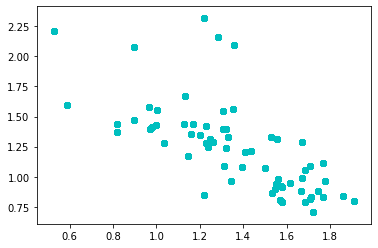

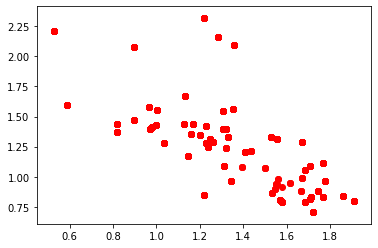

((21038, 14), (21038,), (3006, 14), (3006,), (6012, 14), (6012,))

In [198]:
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# Replace drug pubchemID and Target gene name with extracted features.
# and build X (drug and target features) and Y (binding_values) for each dataset
# (Train, Validation, Test)
#################################################################################

def merge_features(x):
    global drug_pubchemIDs, target_gene_names
    temp = pd.concat([x.drop(columns='Binding_Val').set_index('Drug'), drug_pubchemIDs], axis=1, join='inner').set_index('Target')
    return pd.concat([temp, target_gene_names], axis=1, join='inner').reset_index().drop(columns='index')

# def merge_features_mean_normalized(x):
#     global drug_pubchemIDs, target_gene_names
#     drug_pubchemIDs_temp = (drug_pubchemIDs - drug_pubchemIDs.mean()) / drug_pubchemIDs.std()
#     target_gene_names_temp = (target_gene_names - target_gene_names.mean()) / target_gene_names.std()
#     temp = pd.concat([x.drop(columns='Binding_Val').set_index('Drug'), drug_pubchemIDs_temp], axis=1, join='inner').set_index('Target')
#     return pd.concat([temp, target_gene_names_temp], axis=1, join='inner').reset_index().drop(columns='index')
    
# def merge_features_min_max_normalized(x):
#     global drug_pubchemIDs, target_gene_names
#     drug_pubchemIDs_temp = (drug_pubchemIDs - drug_pubchemIDs.min()) / (drug_pubchemIDs.max() - drug_pubchemIDs.min())
#     target_gene_names_temp = (target_gene_names - target_gene_names.min()) / (target_gene_names.max() - target_gene_names.min())
#     temp = pd.concat([x.drop(columns='Binding_Val').set_index('Drug'), drug_pubchemIDs_temp], axis=1, join='inner').set_index('Target')
#     return pd.concat([temp, target_gene_names_temp], axis=1, join='inner').reset_index().drop(columns='index')

Y_train = train_data['Binding_Val'].reset_index(drop=True)
Y_val = val_data['Binding_Val'].reset_index(drop=True)
Y_test = test_data['Binding_Val'].reset_index(drop=True)

### Standard Building
X_train = merge_features(train_data)
X_val = merge_features(val_data)
X_test = merge_features(test_data)

# ### Mean Normalized Building
# X_train_mean_normalized = merge_features_mean_normalized(train_data)
# X_val_mean_normalized = merge_features_mean_normalized(val_data)
# X_test_mean_normalized = merge_features_mean_normalized(test_data)

# ### Min-Max Normalized Building
# X_train_min_max_normalized = merge_features_min_max_normalized(train_data)
# X_val_min_max_normalized = merge_features_min_max_normalized(val_data)
# X_test_min_max_normalized = merge_features_min_max_normalized(test_data)


# # # Upsample Dataset
# from sklearn.utils import resample

df_train = pd.concat([X_train, Y_train], axis=1)
# # df_val = pd.concat([X_val, Y_val.reset_index(drop=True).astype(int)], axis=1)

# # df = pd.concat([df_train, df_val])
# df_majority = df_train[df_train['Binding_Val'] < 7]
# df_minority = df_train[df_train['Binding_Val'] >= 7]

# df_minority_upsampled = resample(df_minority, 
#                                  replace=True,
#                                  n_samples=len(df_majority)) 

# df_upsampled = pd.concat([df_majority, df_minority_upsampled])
# print(df_upsampled['Binding_Val'].value_counts())

# X_train = df_upsampled.drop(columns='Binding_Val')
# Y_train = df_upsampled['Binding_Val']

plt.scatter('p_1', 'p_2', c='c', data=df_train[df_train['Binding_Val'] < 7])
plt.show()
plt.scatter('p_1', 'p_2', c='r', data=df_train[df_train['Binding_Val'] >= 7])
plt.show()
#################################################################################
#                                   THE END                                     #
#################################################################################
X_train.shape, Y_train.shape, X_val.shape, Y_val.shape, X_test.shape, Y_test.shape

In [199]:
X_train

,avg-sim-drug,avg-binding-drug,n_neighbors_drug,page_rank_drug,p_0,p_1,p_2,avg-sim-target,avg-binding-target,n_neighbors_target,page_rank_target,q_0,q_1,q_2
0,0.384779,5.207784,2,0.014706,1.646309,1.707645,0.812737,0.537702,5.496114,92,0.002690,2.075995,0.876948,0.373820
1,0.608059,5.197991,42,0.029801,1.744242,1.239832,1.250642,0.511765,5.176719,66,0.002337,0.998679,1.606083,0.930371
2,0.595735,5.180722,12,0.010731,1.619126,1.667806,0.885277,0.516071,5.531452,168,0.003047,0.619157,1.489876,1.766768
3,0.591074,5.196909,12,0.010510,1.458437,1.912208,0.795502,0.491921,5.226990,28,0.001277,1.449145,1.264614,0.691132
4,0.574118,5.422174,10,0.012983,1.871207,0.966926,1.578850,0.488487,5.137100,86,0.002740,0.828206,1.803439,0.938814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21033,0.494618,5.624902,2,0.014706,2.108976,0.971604,1.393889,0.512424,5.130627,44,0.001661,1.274350,1.341448,0.809799
21034,0.451456,5.008164,2,0.014706,1.591698,1.554348,0.932134,0.501252,5.344374,80,0.002091,1.289434,1.308174,0.954932
21035,0.565471,6.119103,16,0.018834,2.595975,0.587667,1.593927,0.499694,5.091860,106,0.003087,0.892460,1.773065,0.850456
21036,0.550485,6.094195,14,0.019483,2.330799,0.981049,1.416835,0.508899,5.355879,28,0.001191,1.031768,1.398453,1.230922


## 3.XGboost (25 Points)

To predict the continuous binding affinity for drug–target pairs, we will use [XGBoost](https://xgboost.readthedocs.io/en/latest/) library. 

You need to tune following hyperparameters:
- `learning_rate`: Boosting learning rate
- `n_estimators`: Number of gradient boosted trees.
- `max_depth `: Maximum tree depth for base learners.
- `colsample_bytree`: Subsample ratio of columns when constructing each tree.
- `subsample`: Subsample ratio of the training instance.




Note: `drug_sim_threshold`, `target_sim_threshold` and `latent_dim` in Feature Engineering part can be viewed as hyperparameters too.

In [200]:
import xgboost
from sklearn.metrics import mean_squared_error

### 3.1 Tune Hyperparameters

In [201]:
def plot_model_results(results):
    epochs = len(results['validation_0']['rmse'])
    x_axis = range(0, epochs)
    fig, ax = plt.subplots()
    ax.plot(x_axis, results['validation_0']['rmse'], label='Train')
    ax.plot(x_axis, results['validation_1']['rmse'], label='Validation')
    ax.legend()
    plt.ylabel('RMSE')
    plt.show()

In [202]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from hyperopt import STATUS_OK
from hyperopt import hp
import copy 

space = {
    'learning_rate': hp.loguniform('learning_rate', np.log(0.001), np.log(0.2)),
    'n_estimators':  hp.quniform('n_estimators', 30, 200, 1),
    'max_depth': hp.quniform('max_depth', 3, 35, 1),
#     'subsample': hp.loguniform('subsample', np.log(0.001), np.log(1)),
#     'colsample_bytree': hp.loguniform('colsample_bytree', np.log(0.001), np.log(1)),
    'subsample': hp.uniform('subsample', 0.001, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.001, 1.0),
    'reg_alpha': hp.loguniform('reg_alpha', np.log(0.000005), np.log(0.005)),
    'mean_normalize': hp.choice('mean_normalize', [0]),
    'min_max_normalize': hp.choice('min_max_normalize', [0])
}

def objective(params):
    params['n_estimators'] = int(params['n_estimators'])
    params['max_depth'] = int(params['max_depth'])
    preserved_params = copy.deepcopy(params)
    
    x_train, x_val = X_train, X_val
    if 'mean_normalize' in params:
        if params['mean_normalize'] == 1:
            x_train = X_train_mean_normalized
            x_val = X_val_mean_normalized
        del params['mean_normalize']
    
    if 'min_max_normalize' in params:
        if params['min_max_normalize'] == 1:
            x_train = X_train_min_max_normalized
            x_val = X_val_min_max_normalized
        del params['min_max_normalize']
    
    model = xgboost.XGBRegressor(objective='reg:linear', 
                                 eval_metric='rmse',
                                 **params)
    
    model.fit(X_train,
              Y_train,
              eval_metric="rmse", 
              eval_set=[(x_train, Y_train), (x_val, Y_val)],
              verbose=False)
    
#     kfold = KFold(n_splits=5, random_state=7)
#     results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring='neg_mean_squared_error')
    
    results = model.evals_result()
    loss = results['validation_1']['rmse'][-1]
    print("###########################")
    print("Loss is: " + str(loss))
    print("Params are:")
    print(preserved_params)
    print("###########################\n\n")
    
    return {'loss': loss, 'params': preserved_params, 'status': STATUS_OK}


from hyperopt import fmin
from hyperopt import tpe
from hyperopt import Trials

bayes_trials = Trials()

MAX_EVALS = 30

best = fmin(fn = objective, space = space, algo = tpe.suggest, 
            max_evals = MAX_EVALS)#, trials = bayes_trials)

print(best)

[19:19:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
  0%|          | 0/30 [00:00<?, ?trial/s, best loss=?]

/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \



###########################                           
Loss is: 0.631619                                     
Params are:                                           
{'colsample_bytree': 0.9218158315308619, 'learning_rate': 0.08685728253904504, 'max_depth': 33, 'mean_normalize': 0, 'min_max_normalize': 0, 'n_estimators': 160, 'reg_alpha': 7.071636373800561e-06, 'subsample': 0.055388072845547476}
###########################                           


[19:19:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
###########################                                           
Loss is: 3.12306                                                      
Params are:                                                           
{'colsample_bytree': 0.40569288632531025, 'learning_rate': 0.002799645309333039, 'max_depth': 23, 'mean_normalize': 0, 'min_max_normalize': 0, 'n_estimators': 176, 'reg_alpha': 0.0010451985835629497, 'subsample': 0.9

###########################                                            
Loss is: 4.51279                                                       
Params are:                                                            
{'colsample_bytree': 0.9696113991174681, 'learning_rate': 0.0016569368255496533, 'max_depth': 28, 'mean_normalize': 0, 'min_max_normalize': 0, 'n_estimators': 66, 'reg_alpha': 4.524406825198954e-05, 'subsample': 0.39891101478333635}
###########################                                            


[19:20:48] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
###########################                                            
Loss is: 2.641761                                                      
Params are:                                                            
{'colsample_bytree': 0.9687512048629492, 'learning_rate': 0.0038869176473873917, 'max_depth': 24, 'mean_normalize': 0, 'min_max_normalize': 0, 'n

[19:22:19] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
###########################                                            
Loss is: 1.447881                                                      
Params are:                                                            
{'colsample_bytree': 0.3098549964407334, 'learning_rate': 0.010098176692124329, 'max_depth': 24, 'mean_normalize': 0, 'min_max_normalize': 0, 'n_estimators': 135, 'reg_alpha': 0.00445180870517955, 'subsample': 0.6066984771493996}
###########################                                            


[19:22:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
###########################                                            
Loss is: 2.345021                                                      
Params are:                                                            
{'colsample_bytree': 0.533108869

In [203]:
print("Best Hyperparmeters are:")
best

Best Hyperparmeters are:


{'colsample_bytree': 0.5020279954131707,
 'learning_rate': 0.07025526367748681,
 'max_depth': 26.0,
 'mean_normalize': 0,
 'min_max_normalize': 0,
 'n_estimators': 148.0,
 'reg_alpha': 5.592714177707093e-05,
 'subsample': 0.793430753784419}

[19:23:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Validation RMSE: 0.549296


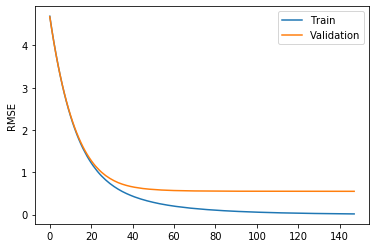

In [204]:
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# Tune hyperparameters values and train model using .fit with Train data
# you can use l1 and l2 regularization terms too
# after training calculate Root Mean Square Error (RMSE) for validation data
#################################################################################

best['max_depth'] = int(best['max_depth'])
best['n_estimators'] = int(best['n_estimators'])
if 'mean_normalize' in best:
    del best['mean_normalize']
    
if 'min_max_normalize' in best:
    del best['min_max_normalize'] 

model = xgboost.XGBRegressor(objective='reg:linear',
                             eval_metric='rmse',
                             **best)

model.fit(X_train,
          Y_train,
          eval_metric="rmse", 
          eval_set=[(X_train, Y_train), (X_val, Y_val)],
          verbose=False)

results = model.evals_result()
validation_rmse = results['validation_1']['rmse'][-1]
#################################################################################
#                                   THE END                                     #
#################################################################################
print("Validation RMSE: %.6f" % validation_rmse)
plot_model_results(model.evals_result())

### 3.2 Ploting Feature importance

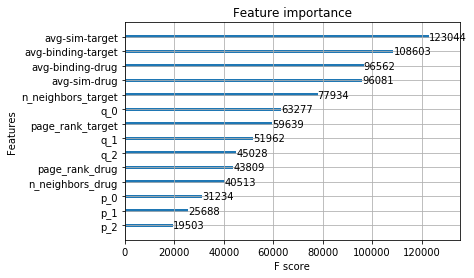

In [205]:
xgboost.plot_importance(model);

### 3.2 Evaluation

Let's make our perdiction binary. either a drug is binded to target or not, use $pK_d$ > 7 threshold as binded (drug-target) pair.

In [206]:
from sklearn.metrics import confusion_matrix
#################################################################################
#                          COMPLETE THE FOLLOWING SECTION                       #
#################################################################################
# Calculate RMSE for Test data. after that
# Calculate accuracy, precision, recall, f1-score for X_test
# for binary prediction setting. you can use confution_matrix from sklearn
#################################################################################
Y_pred = model.predict(X_test)
y_test = np.array(Y_test.values)

def convert_to_bool(x):
    return x > 7

Y_pred_bool = convert_to_bool(Y_pred).astype(int)
Y_test_bool = convert_to_bool(y_test).astype(int)

tn, fp, fn, tp = confusion_matrix(Y_test_bool, Y_pred_bool).ravel()

test_rmse = np.sqrt(mean_squared_error(Y_test, Y_pred))
test_acc = (tp + tn) / (tp + fp + fn + tn)
test_percision = tp / (tp + fp)
test_recall = tp / (tp + fn)
test_f1 = (2 * test_percision * test_recall) / (test_percision + test_recall)
#################################################################################
#                                   THE END                                     #
#################################################################################
print("Test RMSE: %.3f" % test_rmse)
print("Test Accuracy: %.3f" % test_acc)
print("Test Percision: %.3f" % test_percision)
print("Test Recall: %.3f" % test_recall)
print("Test F1-Score: %.3f" % test_f1)

Test RMSE: 0.529
Test Accuracy: 0.954
Test Percision: 0.845
Test Recall: 0.500
Test F1-Score: 0.628


## 4.Classification (25 Points)

Change Binding values to binary values with threshold $pK_d$ > 7 
and use X_train to train any Classifier method that you like.\
Report `accuracy`, `precision`, `recall`, `f1-score` for X_test. 



In [214]:
# Upsample Dataset

from sklearn.utils import resample

df_train = pd.concat([X_train, convert_to_bool(Y_train).astype(int)], axis=1)
df_val = pd.concat([X_val, convert_to_bool(Y_val).astype(int)], axis=1)

# df = pd.concat([df_train, df_val])
print(df_train['Binding_Val'].value_counts())
df_majority = df_train[df_train['Binding_Val'] == 0]
df_minority = df_train[df_train['Binding_Val'] == 1]

df_minority_upsampled = resample(df_minority, 
                                 replace=True,
                                 n_samples=len(df_majority)) 
df_upsampled = pd.concat([df_majority, df_minority_upsampled])
print(df_upsampled['Binding_Val'].value_counts())

X_ = df_upsampled.drop(columns='Binding_Val')
Y_ = df_upsampled['Binding_Val']

Y_val_bool = convert_to_bool(Y_val).astype(int)
Y_test_bool = convert_to_bool(Y_test).astype(int)

0    19288
1     1750
Name: Binding_Val, dtype: int64
1    19288
0    19288
Name: Binding_Val, dtype: int64


In [216]:
print(Y_.value_counts())
print(Y_val_bool.value_counts())
print(Y_test_bool.value_counts())

1    19288
0    19288
Name: Binding_Val, dtype: int64
0    2767
1     239
Name: Binding_Val, dtype: int64
0    5544
1     468
Name: Binding_Val, dtype: int64


In [224]:
def plot_model_results_log(results):
    epochs = len(results['validation_0']['auc'])
    x_axis = range(0, epochs)
    fig, ax = plt.subplots()
    ax.plot(x_axis, results['validation_0']['auc'], label='Train')
    ax.plot(x_axis, results['validation_1']['auc'], label='Validation')
    ax.legend()
    plt.ylabel('auc')
    plt.show()

In [227]:
from sklearn import preprocessing

space = {
    'learning_rate': hp.loguniform('learning_rate', np.log(0.001), np.log(0.2)),
    'n_estimators':  hp.quniform('n_estimators', 30, 200, 1),
    'max_depth': hp.quniform('max_depth', 3, 35, 1),
#     'subsample': hp.loguniform('subsample', np.log(0.001), np.log(1)),
#     'colsample_bytree': hp.loguniform('colsample_bytree', np.log(0.001), np.log(1)),
    'subsample': hp.uniform('subsample', 0.001, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.001, 1.0),
    'reg_alpha': hp.loguniform('reg_alpha', np.log(0.000005), np.log(0.005)),
}

def objective(params):
    params['n_estimators'] = int(params['n_estimators'])
    params['max_depth'] = int(params['max_depth'])
    preserved_params = copy.deepcopy(params)
    
    model = xgboost.XGBClassifier(objective='binary:logistic', 
                                 eval_metric='auc',
                                 **params)
    
    model.fit(X_,
              Y_,
              eval_metric="auc", 
              eval_set=[(X_, Y_), (X_val, Y_val_bool)],
              verbose=False)
    
#     kfold = KFold(n_splits=5, random_state=7)
#     results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring='neg_mean_squared_error')
    
    results = model.evals_result()
    loss = -results['validation_1']['auc'][-1]
    print("###########################")
    print("Loss is: " + str(loss))
    print("Params are:")
    print(preserved_params)
    print("###########################\n\n")
    
    return {'loss': loss, 'params': preserved_params, 'status': STATUS_OK}

trials = Trials()

MAX_EVALS = 30
best = fmin(objective, space, algo=tpe.suggest, max_evals=MAX_EVALS, trials=trials)

###########################                           
Loss is: -0.911641                                    
Params are:                                           
{'colsample_bytree': 0.3603877618089866, 'learning_rate': 0.0011539205961750517, 'max_depth': 32, 'n_estimators': 134, 'reg_alpha': 6.146214209592325e-06, 'subsample': 0.29724869055411596}
###########################                           


###########################                                            
Loss is: -0.807675                                                     
Params are:                                                            
{'colsample_bytree': 0.08304911373208021, 'learning_rate': 0.007771874890291096, 'max_depth': 34, 'n_estimators': 91, 'reg_alpha': 6.483537306769436e-06, 'subsample': 0.2991752213398841}
###########################                                            


###########################                                            
Loss is: -0.911521                      

Loss is: -0.876005                                                      
Params are:                                                             
{'colsample_bytree': 0.6923241546650041, 'learning_rate': 0.0014319139229865931, 'max_depth': 4, 'n_estimators': 163, 'reg_alpha': 0.0008939590060806452, 'subsample': 0.9676056075544212}
###########################                                             


###########################                                             
Loss is: -0.919247                                                      
Params are:                                                             
{'colsample_bytree': 0.542106702345238, 'learning_rate': 0.03432618685005914, 'max_depth': 31, 'n_estimators': 130, 'reg_alpha': 0.0027899151600794623, 'subsample': 0.583605457641053}
###########################                                             


###########################                                             
Loss is: -0.911573                       

In [228]:
print("Best Hyperparmeters are:")
best

Best Hyperparmeters are:


{'colsample_bytree': 0.5138918059934873,
 'learning_rate': 0.012807827052556684,
 'max_depth': 27.0,
 'n_estimators': 198.0,
 'reg_alpha': 0.0042544729561156255,
 'subsample': 0.5985022282531094}

Validation LogLoss: 0.919637


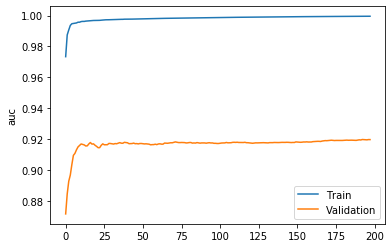

In [229]:
best['max_depth'] = int(best['max_depth'])
best['n_estimators'] = int(best['n_estimators'])
if 'mean_normalize' in best:
    del best['mean_normalize']
    
if 'min_max_normalize' in best:
    del best['min_max_normalize'] 


model = xgboost.XGBClassifier(objective='binary:logistic', 
                             eval_metric='auc',
                             **best)

model.fit(X_,
          Y_,
          eval_metric='auc', 
          eval_set=[(X_, Y_), (X_val, Y_val_bool)],
          verbose=False)

results = model.evals_result()
validation_logloss = results['validation_1']['auc'][-1]
#################################################################################
#                                   THE END                                     #
#################################################################################
print("Validation LogLoss: %.6f" % validation_logloss)
plot_model_results_log(model.evals_result())

In [230]:
from sklearn.metrics import confusion_matrix

Y_pred_bool = model.predict(X_test)

tn, fp, fn, tp = confusion_matrix(Y_test_bool, Y_pred_bool).ravel()

test_acc = (tp + tn) / (tp + fp + fn + tn)
test_percision = tp / (tp + fp)
test_recall = tp / (tp + fn)
test_f1 = (2 * test_percision * test_recall) / (test_percision + test_recall)



print("Test Accuracy: %.3f" % test_acc)
print("Test Percision: %.3f" % test_percision)
print("Test Recall: %.3f" % test_recall)
print("Test F1-Score: %.3f" % test_f1)

Test Accuracy: 0.944
Test Percision: 0.629
Test Recall: 0.699
Test F1-Score: 0.662


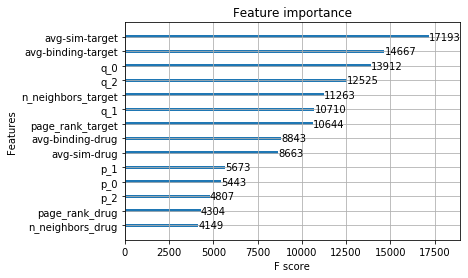

In [231]:
xgboost.plot_importance(model);

# Extra Points

There is 5 extra points in parts 3 & 4 rewarded to the top 15% students with the best results. Your model will be trained again with a random seed on our dataset. Please have in mind:
- You should only use train or validation data for training phase of your model.
- Your code must be readable and runnable in other enviroments.
- If you are going to use other libraries, mention them.